<a href="https://colab.research.google.com/github/Arcane-WD/CBIT-Wintering-Upskilling/blob/main/Day_6_Assignment_WFH_Task.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##  Task 1:Simulate a dataset for Classification with 3 Labels, 6 attributes with interaction among them,10000 instances and use Uniform random function


In [ ]:
from sklearn.datasets import make_classification
# Generating Dataset without Uniform Randomness
features_c, target_c = make_classification(n_samples =10000,
                                       n_features = 6,
                                       n_informative = 4,
                                       n_redundant =2,
                                       n_classes = 3,
                                       random_state = 1)

In [ ]:
print("Original features shape:", features_c.shape)
print("Sample target (first 5 rows):", target_c[:5])

Original features shape: (10000, 6)
Sample target (first 5 rows): [1 1 0 2 2]


## Task 2: Simulate a dataset for regression 6 attributes with interaction among them, 10000 instances and use normal random function


In [ ]:
from sklearn.datasets import make_regression
# Generating Dataset without Normal Randomness
features_r, target_r, coeffecients_r = make_regression(n_samples = 10000,
                                                 n_features = 6,
                                                 n_informative = 6,
                                                 effective_rank =4,
                                                 noise = 0.0,
                                                 coef = True,
                                                 random_state=1)

In [ ]:
print("Original features shape:", features_r.shape)
print("Sample target (first 5 rows):", target_r[:5])

Original features shape: (10000, 6)
Sample target (first 5 rows): [ 1.04984476  0.4702956   0.35767303 -0.51556941  1.03363794]


## Task 3: Simulate a dataset for Clustering 6 attributes with interaction among them, 10000 instances and use normal random function.


In [ ]:
from sklearn.datasets import make_blobs
# Generating dataset wihtout Normal Random Function
clst_features, clst_target = make_blobs(
    n_samples=10000,
    n_features=6,
    centers=3,
    random_state=1
)

In [ ]:
print("Features shape:", clst_features.shape)
print("Sample target (first 5 rows):", clst_target[:5])

Features shape: (10000, 6)
Sample target (first 5 rows): [2 0 1 1 1]


## Task 4: Build a Non Linear Regression model and get 90% Accuracy for the above simulated data in task 2. Split the data into 70% and 30% respectively for Training and Testing for model building


In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures

In [ ]:
# Making Non Linear Interaction among the features
interaction = PolynomialFeatures(degree=2, include_bias=False, interaction_only=False)
nl_features_r = interaction.fit_transform(features_r)
nl_features_r.shape

(10000, 27)

In [ ]:
# Creating train test split
from sklearn.model_selection import train_test_split
X_nl_train, X_nl_test, y_nl_train, y_nl_test = train_test_split(nl_features_r,target_r, test_size = 0.3, random_state=1)
X_nl_train.shape

(7000, 27)

In [ ]:
regression = LinearRegression()
nlr_model = regression.fit(X_nl_train, y_nl_train)

In [ ]:
from sklearn.metrics import mean_squared_error
nlr_predict = nlr_model.predict(X_nl_test)
nlr_mse = mean_squared_error(y_nl_test, nlr_predict)
nlr_mse

6.176925629830507e-31

In [ ]:
print("The Mean Square Error is:", int(nlr_mse))

The Mean Square Error is: 0


In [ ]:
from sklearn.metrics import mean_absolute_percentage_error
nlr_mape = mean_absolute_percentage_error(y_nl_test, nlr_predict)
print("Accuracy via MAPE is:", 100 - int(nlr_mape*100), "%")
print(nlr_mape)

Accuracy via MAPE is: 100 %
3.7901834079515015e-15


## Task 5: Build any five Classifiers for the above dataset in question1 and compare the metrics of these built models. Metrics need to build are Accuracy, Precision, Recall, F1Score. Split the data into 70% and 30% respectively for Training and Testing for model building


In [ ]:
from sklearn.model_selection import train_test_split
X_c_train, X_c_test, y_c_train, y_c_test = train_test_split(features_c,target_c, test_size = 0.3, random_state=1)

In [ ]:
# Decision Tree Classifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
dt_model = DecisionTreeClassifier().fit(X_c_train, y_c_train)
dt_predict = dt_model.predict(X_c_test)
dt_accuracy = accuracy_score(y_c_test, dt_predict)
dt_precision = precision_score(y_c_test, dt_predict, average='weighted')
dt_recall = recall_score(y_c_test, dt_predict, average='weighted')
dt_f1 = f1_score(y_c_test, dt_predict, average='weighted')
print("Accuracy:", dt_accuracy)
print("Precision:", dt_precision)
print("Recall:", dt_recall)
print("F1 Score:", dt_f1)

Accuracy: 0.8076666666666666
Precision: 0.8075363202864676
Recall: 0.8076666666666666
F1 Score: 0.8075870181580971


In [ ]:
# Logistic Regression
from sklearn.linear_model import LogisticRegression
log_model = LogisticRegression().fit(X_c_train, y_c_train)
log_predict = log_model.predict(X_c_test)
log_accuracy = accuracy_score(y_c_test, log_predict)
log_precision = precision_score(y_c_test, log_predict, average='weighted')
log_recall = recall_score(y_c_test, log_predict, average='weighted')
log_f1 = f1_score(y_c_test, log_predict, average='weighted')
print("Accuracy:", log_accuracy)
print("Precision:", log_precision)
print("Recall:", log_recall)
print("F1 Score:", log_f1)

Accuracy: 0.633
Precision: 0.6318359002208465
Recall: 0.633
F1 Score: 0.6320635986501537


In [ ]:
# Naive Bayes
from sklearn.naive_bayes import GaussianNB
nb_model = GaussianNB().fit(X_c_train, y_c_train)
nb_predict = nb_model.predict(X_c_test)
nb_accuracy = accuracy_score(y_c_test, nb_predict)
nb_precision = precision_score(y_c_test, nb_predict, average='weighted')
nb_recall = recall_score(y_c_test, nb_predict, average='weighted')
nb_f1 = f1_score(y_c_test, nb_predict, average='weighted')
print("Accuracy:", nb_accuracy)
print("Precision:", nb_precision)
print("Recall:", nb_recall)
print("F1 Score:", nb_f1)

Accuracy: 0.6086666666666667
Precision: 0.6130654579329486
Recall: 0.6086666666666667
F1 Score: 0.5872835974333028


In [ ]:
# Random Forest Classifier
from sklearn.ensemble import RandomForestClassifier
rf_model = RandomForestClassifier().fit(X_c_train, y_c_train)
rf_predict = rf_model.predict(X_c_test)
rf_accuracy = accuracy_score(y_c_test, rf_predict)
rf_precision = precision_score(y_c_test, rf_predict, average='weighted')
rf_recall = recall_score(y_c_test, rf_predict, average='weighted')
rf_f1 = f1_score(y_c_test, rf_predict, average='weighted')
print("Accuracy:", rf_accuracy)
print("Precision:", rf_precision)
print("Recall:", rf_recall)
print("F1 Score:", rf_f1)

Accuracy: 0.8743333333333333
Precision: 0.8747643464422157
Recall: 0.8743333333333333
F1 Score: 0.8744036003578611


In [ ]:
# K Nearest Neighbors
from sklearn.neighbors import KNeighborsClassifier
knn_model = KNeighborsClassifier().fit(X_c_train, y_c_train)
knn_predict = knn_model.predict(X_c_test)
knn_accuracy = accuracy_score(y_c_test, knn_predict)
knn_precision = precision_score(y_c_test, knn_predict, average='weighted')
knn_recall = recall_score(y_c_test, knn_predict, average='weighted')
knn_f1 = f1_score(y_c_test, knn_predict, average='weighted')
print("Accuracy:", knn_accuracy)
print("Precision:", knn_precision)
print("Recall:", knn_recall)
print("F1 Score:", knn_f1)

Accuracy: 0.8756666666666667
Precision: 0.8755409450319419
Recall: 0.8756666666666667
F1 Score: 0.8753968001072299


The visualization code has been generated using ChatGPT


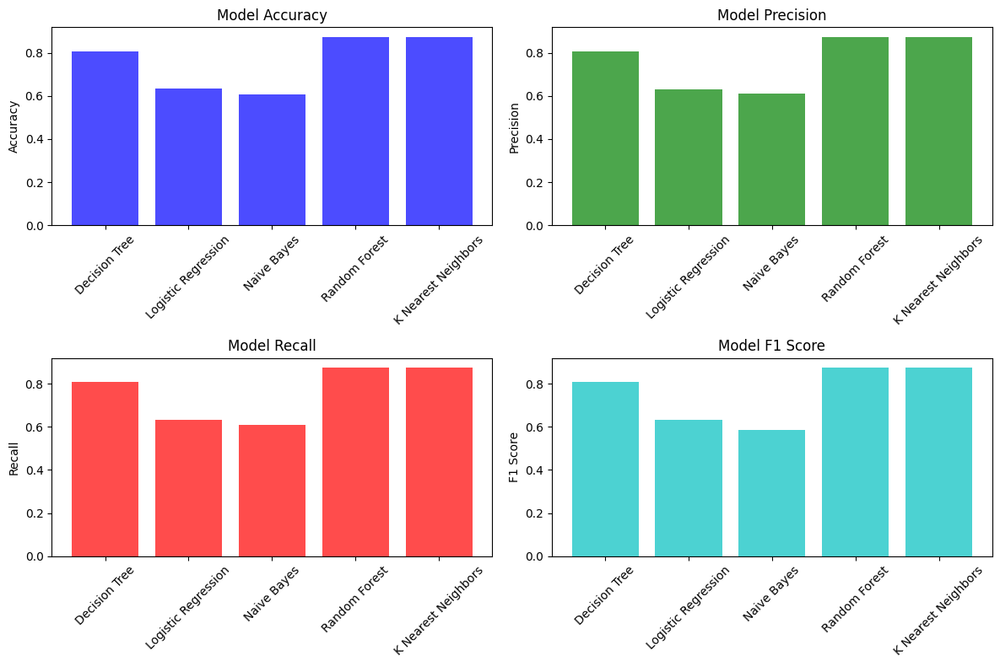

The visualization code has been generated using ChatGPT


In [ ]:
import matplotlib.pyplot as plt

print("The visualization code has been generated using ChatGPT")

# Define models and metrics
models = ['Decision Tree', 'Logistic Regression', 'Naive Bayes', 'Random Forest', 'K Nearest Neighbors']
accuracies = [dt_accuracy, log_accuracy, nb_accuracy, rf_accuracy, knn_accuracy]
precisions = [dt_precision, log_precision, nb_precision, rf_precision, knn_precision]
recalls = [dt_recall, log_recall, nb_recall, rf_recall, knn_recall]
f1_scores = [dt_f1, log_f1, nb_f1, rf_f1, knn_f1]

# Plotting the metrics for each model
x = range(len(models))

plt.figure(figsize=(12, 8))

# Create subplots for each metric
plt.subplot(2, 2, 1)
plt.bar(x, accuracies, color='b', alpha=0.7)
plt.xticks(x, models, rotation=45)
plt.ylabel('Accuracy')
plt.title('Model Accuracy')

plt.subplot(2, 2, 2)
plt.bar(x, precisions, color='g', alpha=0.7)
plt.xticks(x, models, rotation=45)
plt.ylabel('Precision')
plt.title('Model Precision')

plt.subplot(2, 2, 3)
plt.bar(x, recalls, color='r', alpha=0.7)
plt.xticks(x, models, rotation=45)
plt.ylabel('Recall')
plt.title('Model Recall')

plt.subplot(2, 2, 4)
plt.bar(x, f1_scores, color='c', alpha=0.7)
plt.xticks(x, models, rotation=45)
plt.ylabel('F1 Score')
plt.title('Model F1 Score')

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

print("The visualization code has been generated using ChatGPT")

## Task 6: Load CSV, EXCEL, EXCELS, JSON format datasets from local host and Websites into Colab interface and split them into Train and test data.

In [191]:
#Reading CSV File
CSV_FILE = pd.read_csv("/content/weight-height.csv")
Features = CSV_FILE.iloc[:,:2]
Target = CSV_FILE['Weight']

In [192]:
X_train,X_test,y_train,y_test = train_test_split(Features,Target,test_size = 0.3)
print(f"{X_train.shape},{y_train.shape},{X_test.shape},{y_test.shape}")

(7000, 2),(7000,),(3000, 2),(3000,)


In [193]:
XLFile = pd.read_excel("/content/weight-height.xlsx")
Features = XLFile.iloc[:,:2]
Target = XLFile['Weight']

In [194]:
X_train,X_test,y_train,y_test = train_test_split(Features,Target,test_size = 0.3)
print(f"{X_train.shape},{y_train.shape},{X_test.shape},{y_test.shape}")

(7000, 2),(7000,),(3000, 2),(3000,)


In [195]:
JsonFile = pd.read_json("/content/iris.json")
Features = JsonFile.iloc[:,:4]
Target = JsonFile['species']

In [196]:
X_train,X_test,y_train,y_test = train_test_split(Features,Target,test_size = 0.3)
print(f"{X_train.shape},{y_train.shape},{X_test.shape},{y_test.shape}")

(105, 4),(105,),(45, 4),(45,)


## Task 7: Load different datasets from SkLearn library into Colab interface and split them into train and test data. Apply Normalization techniques to convert input data into standardize.


In [ ]:
# Printing the names of different datasets in sklearn library
from sklearn import datasets
print(dir(datasets))

['__all__', '__builtins__', '__cached__', '__doc__', '__file__', '__getattr__', '__loader__', '__name__', '__package__', '__path__', '__spec__', '_arff_parser', '_base', '_california_housing', '_covtype', '_kddcup99', '_lfw', '_olivetti_faces', '_openml', '_rcv1', '_samples_generator', '_species_distributions', '_svmlight_format_fast', '_svmlight_format_io', '_twenty_newsgroups', 'clear_data_home', 'dump_svmlight_file', 'fetch_20newsgroups', 'fetch_20newsgroups_vectorized', 'fetch_california_housing', 'fetch_covtype', 'fetch_file', 'fetch_kddcup99', 'fetch_lfw_pairs', 'fetch_lfw_people', 'fetch_olivetti_faces', 'fetch_openml', 'fetch_rcv1', 'fetch_species_distributions', 'get_data_home', 'load_breast_cancer', 'load_diabetes', 'load_digits', 'load_files', 'load_iris', 'load_linnerud', 'load_sample_image', 'load_sample_images', 'load_svmlight_file', 'load_svmlight_files', 'load_wine', 'make_biclusters', 'make_blobs', 'make_checkerboard', 'make_circles', 'make_classification', 'make_fried

In [ ]:
dataset1 = datasets.load_iris()
dataset2 = datasets.load_diabetes()
dataset3 = datasets.load_breast_cancer()
dataset4 = datasets.load_wine()
feat1 = dataset1.data
feat2 = dataset2.data
feat3 = dataset3.data
feat4 = dataset4.data
tar1 = dataset1.target
tar2 = dataset2.target
tar3 = dataset3.target
tar4 = dataset4.target

In [ ]:
# Applying Normalization
from sklearn.preprocessing import StandardScaler
scfeat1 = StandardScaler().fit_transform(feat1)
scfeat2 = StandardScaler().fit_transform(feat2)
scfeat3 = StandardScaler().fit_transform(feat3)
scfeat4 = StandardScaler().fit_transform(feat4)

In [ ]:
# Printing first 27 values of each standardized dataset
print(scfeat1[:27])
print(scfeat2[:27])
print(scfeat3[:27])
print(scfeat4[:27])

[[-0.90068117  1.01900435 -1.34022653 -1.3154443 ]
 [-1.14301691 -0.13197948 -1.34022653 -1.3154443 ]
 [-1.38535265  0.32841405 -1.39706395 -1.3154443 ]
 [-1.50652052  0.09821729 -1.2833891  -1.3154443 ]
 [-1.02184904  1.24920112 -1.34022653 -1.3154443 ]
 [-0.53717756  1.93979142 -1.16971425 -1.05217993]
 [-1.50652052  0.78880759 -1.34022653 -1.18381211]
 [-1.02184904  0.78880759 -1.2833891  -1.3154443 ]
 [-1.74885626 -0.36217625 -1.34022653 -1.3154443 ]
 [-1.14301691  0.09821729 -1.2833891  -1.44707648]
 [-0.53717756  1.47939788 -1.2833891  -1.3154443 ]
 [-1.26418478  0.78880759 -1.22655167 -1.3154443 ]
 [-1.26418478 -0.13197948 -1.34022653 -1.44707648]
 [-1.87002413 -0.13197948 -1.51073881 -1.44707648]
 [-0.05250608  2.16998818 -1.45390138 -1.3154443 ]
 [-0.17367395  3.09077525 -1.2833891  -1.05217993]
 [-0.53717756  1.93979142 -1.39706395 -1.05217993]
 [-0.90068117  1.01900435 -1.34022653 -1.18381211]
 [-0.17367395  1.70959465 -1.16971425 -1.18381211]
 [-0.90068117  1.70959465 -1.28

## Task 8: Load any data from website/Local host and apply the below data wrangling techniques


In [ ]:
from sklearn import datasets
import pandas as pd

linnerud = datasets.load_linnerud()
df = pd.DataFrame(linnerud.data, columns=linnerud.feature_names)
df.head()

,Chins,Situps,Jumps
0,5.0,162.0,60.0
1,2.0,110.0,60.0
2,12.0,101.0,101.0
3,12.0,105.0,37.0
4,13.0,155.0,58.0


### a) Split


In [ ]:
# Splitting dataset
from sklearn.model_selection import train_test_split
linnerud_train, linnerud_test = train_test_split(df, test_size=0.3, random_state=1)
print(linnerud_train.shape)
print(linnerud_test.shape)

(14, 3)
(6, 3)


### b) merge

In [ ]:
# Merging
mergeset = pd.concat([linnerud_train, linnerud_test])
mergeset.shape

(20, 3)

### c) select rows by conditions


In [ ]:
# Select rows with situps more than 150
df.loc[df["Situps"] > 150]

,Chins,Situps,Jumps
0,5.0,162.0,60.0
4,13.0,155.0,58.0
8,15.0,200.0,40.0
9,17.0,251.0,250.0
11,13.0,210.0,115.0
12,14.0,215.0,105.0
15,12.0,210.0,120.0
17,11.0,230.0,80.0
18,15.0,225.0,73.0


### d) select columns by conditions

In [ ]:
# Selecting Columns by condtion
df.loc[:, "Chins"]

,Chins
0,5.0
1,2.0
2,12.0
3,12.0
4,13.0
5,4.0
6,8.0
7,6.0
8,15.0
9,17.0


### e) Rename columns


In [ ]:
# Renaming columns
df.rename(columns={"Chins": "Chinups"}, inplace=True)
df.head()

,Chinups,Situps,Jumps
0,5.0,162.0,60.0
1,2.0,110.0,60.0
2,12.0,101.0,101.0
3,12.0,105.0,37.0
4,13.0,155.0,58.0


###f) Min, max, avg, varience


In [ ]:
print("Average Chinups:",df["Chinups"].mean())
print("Max Chinups",df["Chinups"].max())
print("Minimum Chinups",df["Chinups"].min())
print("Chinups Varience:",df["Chinups"].var())

Average Chinups: 9.45
Max Chinups 17.0
Minimum Chinups 1.0
Chinups Varience: 27.94473684210526


### g) describe


In [ ]:
df.describe()

,Chinups,Situps,Jumps
count,20.000000,20.000000,20.00000
mean,9.450000,145.550000,70.30000
std,5.286278,62.566575,51.27747
min,1.000000,50.000000,25.00000
25%,4.750000,101.000000,39.50000
50%,11.500000,122.500000,54.00000
75%,13.250000,210.000000,85.25000
max,17.000000,251.000000,250.00000


###h) size


In [ ]:
df.size

60

###I) shape


In [ ]:
df.shape

(20, 3)

###j) find unique values


In [ ]:
df["Chinups"].unique()

array([ 5.,  2., 12., 13.,  4.,  8.,  6., 15., 17., 14.,  1., 11.])

###k)find missing values and fill them with average value/ mode value


In [ ]:
df.isnull().sum()

,0
Chinups,0
Situps,0
Jumps,0


In [ ]:
df.fillna(df.mean(), inplace=True)
df.isnull().sum()

,0
Chinups,0
Situps,0
Jumps,0


###l) replace attributevalue name with other name


In [ ]:
...

Ellipsis

###m)delete columns

In [ ]:
df_del = df.drop(["Situps"], axis=1)
df_del.head()

,Chinups,Jumps
0,5.0,60.0
1,2.0,60.0
2,12.0,101.0
3,12.0,37.0
4,13.0,58.0


###n) delete some rows

In [ ]:
df_row_del = df.drop([0,1,2])
df_row_del.shape

(17, 3)

###o) join datasets(left,right)

In [ ]:
# Join datasets
joined = pd.concat([linnerud_train, linnerud_test])
joined.shape

(20, 3)

###p) groups values by rows

In [ ]:
grouped = df.groupby("Chinups")
grouped.first()

,Situps,Jumps
Chinups,,
1.0,50.0,50.0
2.0,110.0,60.0
4.0,101.0,42.0
5.0,162.0,60.0
6.0,125.0,40.0
8.0,101.0,38.0
11.0,230.0,80.0
12.0,101.0,101.0
13.0,155.0,58.0


###q) loop over columns

In [ ]:
# Loop over columns
for col in df.columns:
    print(col)

Chinups
Situps
Jumps


###r) group rows by time

In [ ]:
# Group rows by time
...

###s)concatenating datasets

In [ ]:
concated = pd.concat([linnerud_train, linnerud_test])
concated.shape

(20, 3)

###t) append rows

In [ ]:
df_appended = pd.concat([df,pd.DataFrame([{"Chinups":2.0,"Situps":150.0,"Jumps":500.0}])], ignore_index=True)
df_appended

,Chinups,Situps,Jumps
0,5.0,162.0,60.0
1,2.0,110.0,60.0
2,12.0,101.0,101.0
3,12.0,105.0,37.0
4,13.0,155.0,58.0
5,4.0,101.0,42.0
6,8.0,101.0,38.0
7,6.0,125.0,40.0
8,15.0,200.0,40.0
9,17.0,251.0,250.0


###u)append columns

In [ ]:
# Append Columns
df.insert(3,"Pushups", [0]*df.shape[0])
df

,Chinups,Situps,Jumps,Pushups
0,5.0,162.0,60.0,0
1,2.0,110.0,60.0,0
2,12.0,101.0,101.0,0
3,12.0,105.0,37.0,0
4,13.0,155.0,58.0,0
5,4.0,101.0,42.0,0
6,8.0,101.0,38.0,0
7,6.0,125.0,40.0,0
8,15.0,200.0,40.0,0
9,17.0,251.0,250.0,0


In [ ]:
df = df.drop("Pushups", axis=1)

###v) reorder columns using pandas lib

In [ ]:
# Reorder Columns
df_reordered = df[["Situps", "Chinups", "Jumps"]]
df_reordered.head()

,Situps,Chinups,Jumps
0,162.0,5.0,60.0
1,110.0,2.0,60.0
2,101.0,12.0,101.0
3,105.0,12.0,37.0
4,155.0,13.0,58.0


##Task 9: Load the Images and audio files. Covert audio file into spectrogram. Apply it for a length of one minute telugu song. Convert a colour image into gray scale image.


In [ ]:
!pip install librosa
import librosa
import IPython.display as ipd

In [ ]:
snd,rate = librosa.load("/content/ass_audio.wav", sr=None)

ipd.Audio(snd, rate=rate)

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.pyplot import rcParams
from IPython.display import set_matplotlib_formats
rcParams['font.size'] = 18
rcParams['lines.linewidth'] = 2
rcParams['figure.figsize'] = (8,8)
rcParams['axes.titlepad'] = 18
rcParams['savefig.pad_inches'] = 0.12
set_matplotlib_formats('png', 'pdf')

<ipython-input-158-33aabc936897>:9: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  set_matplotlib_formats('png', 'pdf')


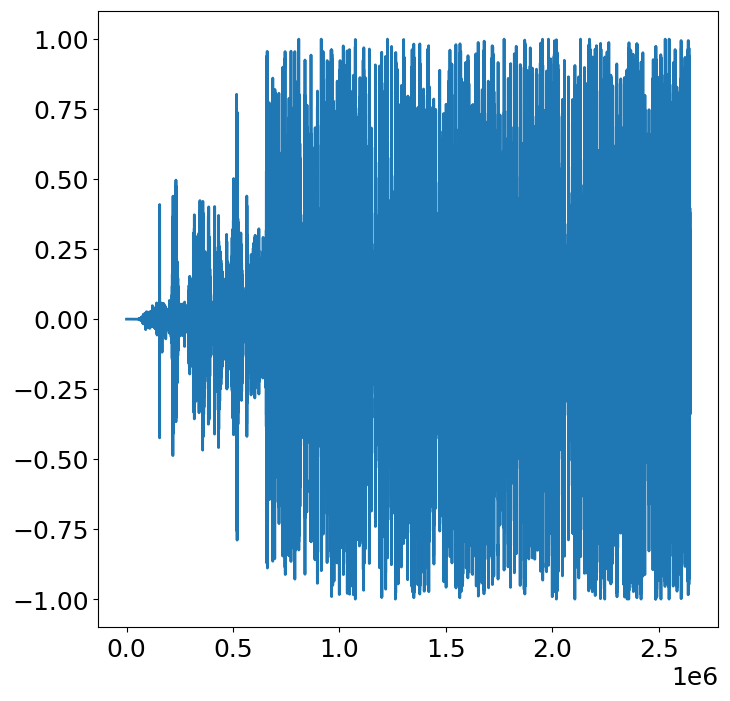

In [ ]:
plt.plot(snd)

/usr/local/lib/python3.10/dist-packages/matplotlib/axes/_axes.py:7939: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


Text(0.5, 1.0, 'ass_audio.wav as a Spectogram')

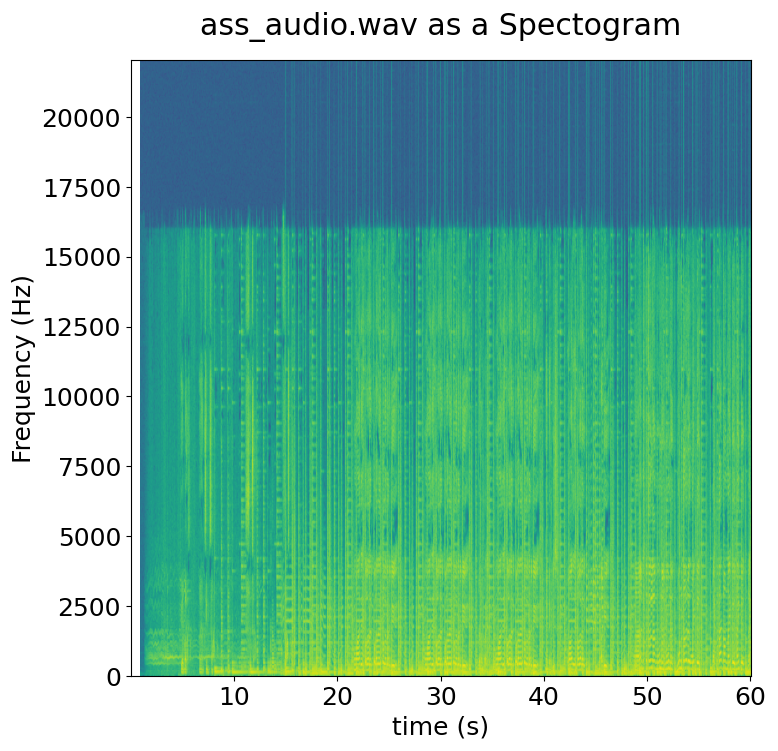

In [ ]:
SPEC = plt.specgram(snd, NFFT=1024,Fs=44100)
plt.ylabel('Frequency (Hz)')
plt.xlabel("time (s)")
plt.title('ass_audio.wav as a Spectogram')

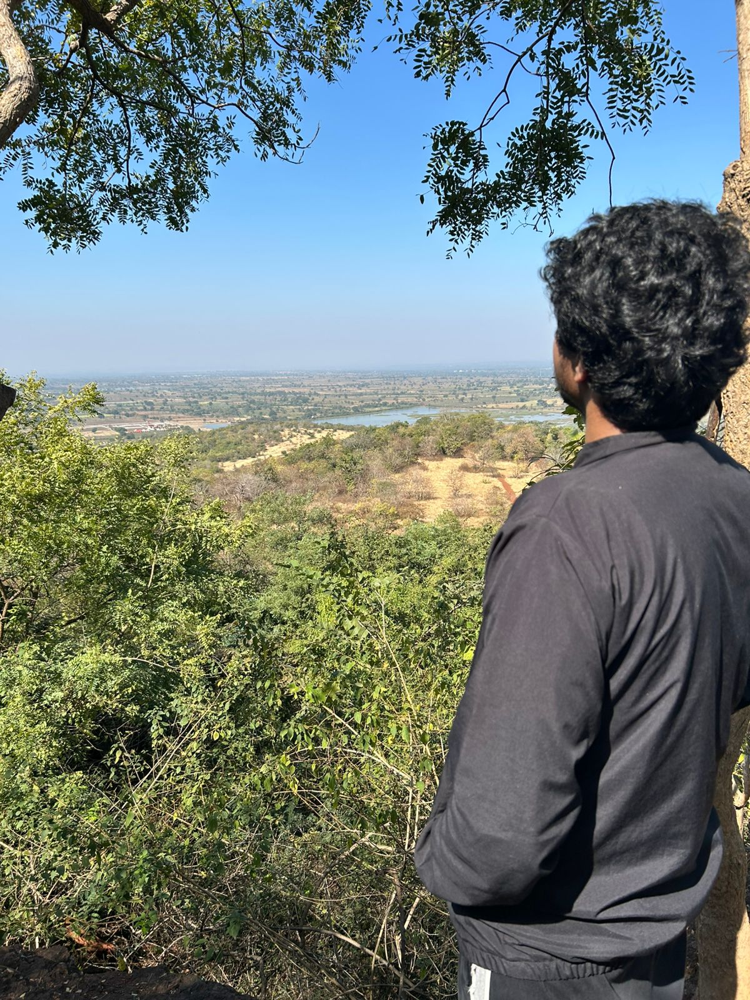

In [ ]:
from PIL import Image
img = Image.open("/content/work vid.jpg")
img

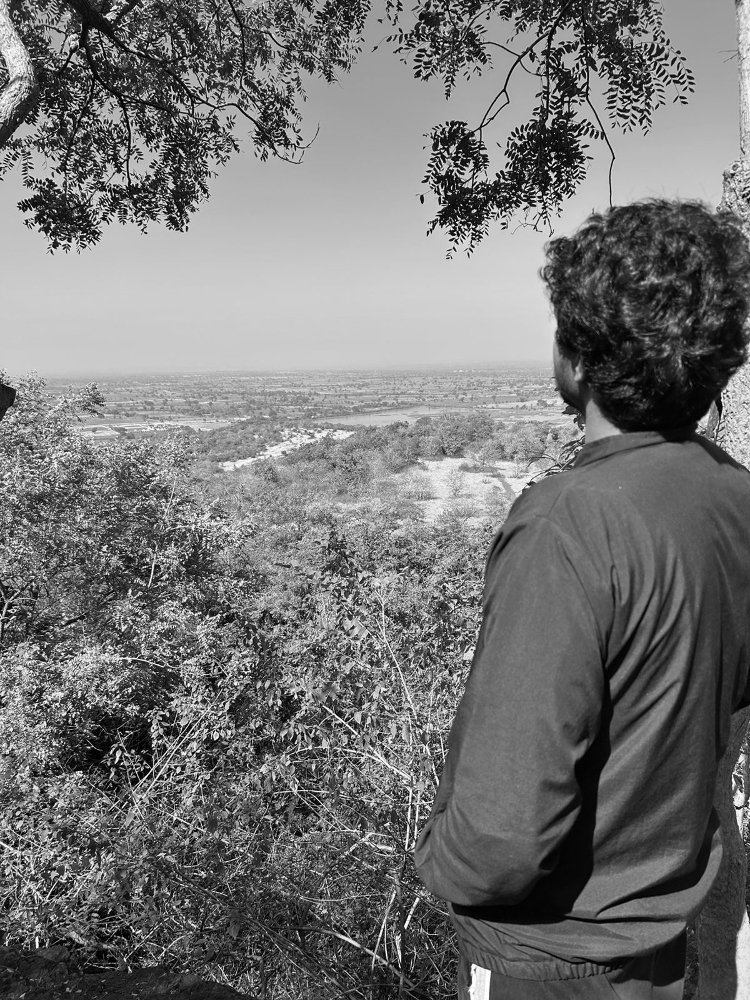

In [ ]:
from PIL.ImageOps import grayscale
bwimg = grayscale(img)
bwimg

##Task 10: Load any numeric data and apply Ridge and Lasso regressions to get 90% accuracy


In [ ]:
from sklearn.datasets import fetch_california_housing
fsh = fetch_california_housing()
features_ch = fsh.data
target_ch = fsh.target

In [ ]:
from sklearn.model_selection import train_test_split
X_ch_train, X_ch_test, y_ch_train, y_ch_test = train_test_split(features_ch,target_ch, test_size = 0.3, random_state=1)

In [ ]:
from sklearn.linear_model import Ridge
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train_sc = sc.fit_transform(X_ch_train)
X_test_sc = sc.transform(X_ch_test)
ridge_reg = Ridge()
ridge_model = ridge_reg.fit(X_train_sc, y_ch_train)

In [ ]:
ridge_predict = ridge_model.predict(X_test_sc)
ridge_mse = mean_squared_error(y_ch_test, ridge_predict)
ridge_mse

0.5296238879171193

In [ ]:
from sklearn.linear_model import Lasso
lasso_reg = Lasso()
lasso_model = lasso_reg.fit(X_train_sc, y_ch_train)

In [ ]:
lasso_predict = lasso_model.predict(X_test_sc)
lasso_mse = mean_squared_error(y_ch_test, lasso_predict)
lasso_mse

1.3153894523996887

##Task 11: Load Digits dataset and apply clustering models to get its metrics


In [ ]:
digits = datasets.load_digits()
features_d = digits.data
target_d = digits.target

In [ ]:
from sklearn.model_selection import train_test_split
X_d_train, X_d_test, y_d_train, y_d_test = train_test_split(features_d,target_d, test_size = 0.3, random_state=1)

In [ ]:
# CLustering models
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
kmeans_model = KMeans(n_clusters=10, random_state=1).fit(X_d_train)

In [ ]:
kmeans_predict = kmeans_model.predict(X_d_test)
kmeans_score = silhouette_score(X_d_test, kmeans_predict)
kmeans_score

0.1729393018253791

##Task 12: Implement the techniques to handle imbalanced dataset to balanced dataset with binary class data


In [197]:
from collections import Counter
from sklearn.datasets import make_classification
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.combine import SMOTEENN
from sklearn.model_selection import train_test_split

X27, y27 = make_classification(n_samples=1000, n_features=6, n_classes=2,
                                weights=[0.9, 0.1], random_state=42)

X27_train, X27_test, y27_train, y27_test = train_test_split(X27, y27, test_size=0.3, random_state=42)

smote27 = SMOTE(random_state=42)
X27_res_smote, y27_res_smote = smote27.fit_resample(X27_train, y27_train)

undersample27 = RandomUnderSampler(random_state=42)
X27_res_undersampled, y27_res_undersampled = undersample27.fit_resample(X27_train, y27_train)

smoteenn27 = SMOTEENN(random_state=42)
X27_res_smoteenn, y27_res_smoteenn = smoteenn27.fit_resample(X27_train, y27_train)

print(f"Original class distribution: {Counter(y27)}")
print(f"SMOTE class distribution: {Counter(y27_res_smote)}")
print(f"Undersampled class distribution: {Counter(y27_res_undersampled)}")
print(f"SMOTEENN class distribution: {Counter(y27_res_smoteenn)}")


Original class distribution: Counter({0: 898, 1: 102})
SMOTE class distribution: Counter({0: 618, 1: 618})
Undersampled class distribution: Counter({0: 82, 1: 82})
SMOTEENN class distribution: Counter({1: 579, 0: 542})


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/utils/_tags.py:354: FutureWarning: The SMOTE or classes from which it inherits use `_get_tags` and `_more_tags`. Please define the `__sklearn_tags__` method, or inherit from `sklearn.base.BaseEstimator` and/or other appropriate mixins such as `sklearn.base.TransformerMixin`, `sklearn.base.ClassifierMixin`, `sklearn.base.RegressorMixin`, and `sklearn.base.OutlierMixin`. From scikit-learn 1.7, not defining `__sklearn_tags__` will raise an error.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warn

##Task 13: Apply KNN classifier on appropriate data. Find best neighbourhood size, Indices of neighbourhood, distances of neighbourhood by taking a random new tuple.


In [ ]:
from sklearn import datasets
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
iris = datasets.load_iris()
iris_features = iris.data
iris_target = iris.target

In [ ]:
standardizer = StandardScaler()
features_standardized = standardizer.fit_transform(iris_features)

In [ ]:
nearest_neighbours = KNeighborsClassifier(n_neighbors=7).fit(features_standardized, iris_target)

In [ ]:
new_observation = [[1.2, 1.0, 0.5, 0.8]]
new_observation = standardizer.transform(new_observation)
distances, indices = nearest_neighbours.kneighbors(new_observation)
print(features_standardized[indices])
print(distances)
print(iris_target[indices])

[[[-1.62768839 -1.74335684 -1.39706395 -1.18381211]
  [-1.02184904 -2.43394714 -0.14664056 -0.26238682]
  [-1.02184904 -1.74335684 -0.26031542 -0.26238682]
  [-1.14301691 -1.51316008 -0.26031542 -0.26238682]
  [-1.74885626 -0.36217625 -1.34022653 -1.3154443 ]
  [-1.87002413 -0.13197948 -1.51073881 -1.44707648]
  [-0.90068117 -1.28296331 -0.4308277  -0.13075464]]]
[[5.05802832 5.42919089 5.72343643 5.75216007 5.92022335 6.02250871
  6.03561674]]
[[0 1 1 1 0 0 1]]


In [ ]:
from sklearn.pipeline import Pipeline, FeatureUnion
from sklearn.model_selection import GridSearchCV
knn = KNeighborsClassifier(n_neighbors=5, n_jobs=-1)
pipe = Pipeline([("standardizer", standardizer), ("knn", knn)])
search_space = [{"knn__n_neighbors": [1,2,3,4,5,6,7,8,9,10]}]
classifier = GridSearchCV(pipe, search_space, cv=5, verbose=0).fit(features_standardized, iris_target)
classifier.best_estimator_.get_params()["knn__n_neighbors"]

6

## Task 14: Find support vectors and their probabilities by applying SVM on any binary classification dataset. Also find the best model to generate support vectors. Get the metrics for this trained model. Represent its graph also.


In [182]:
from sklearn.svm import SVC
from sklearn import datasets
from sklearn.preprocessing import StandardScaler
import numpy as np

In [183]:
iris = datasets.load_iris()
features = iris.data[:100,:2]
target = iris.target[:100]

In [185]:
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)
svc = SVC(kernel = "linear",C=1)
model = svc.fit(features_scaled, target)

In [186]:
model.predict(scaler.transform([[5.9, 3.0]]))


array([1])

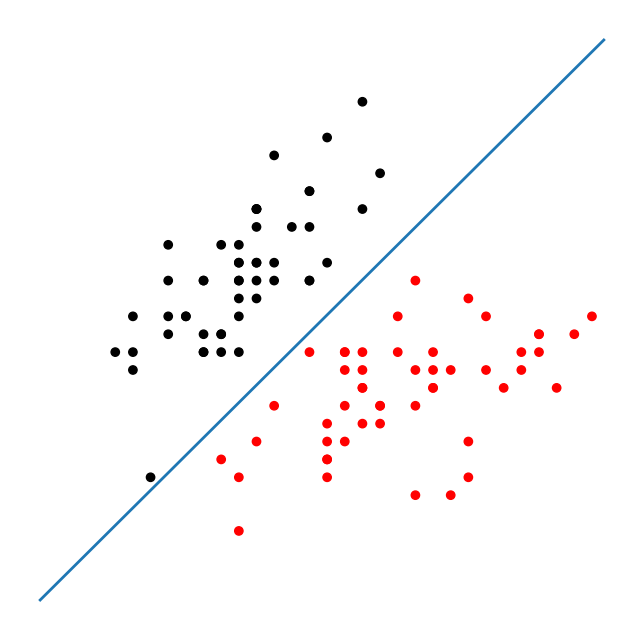

In [187]:
import matplotlib.pyplot as plt
color = ["black" if c==0 else "red" for c in target]
plt.scatter(features_scaled[:,0], features_scaled[:,1], c=color)

w = svc.coef_[0]
a=-w[0]/w[1]
a*=1.1
xx = np.linspace(-2.5,2.5)
yy = a*xx - (svc.intercept_[0]/w[1])

plt.plot(xx,yy)
plt.axis("off"), plt.show();

In [188]:
model.support_

array([20, 25, 31, 36, 41, 57, 59, 84, 85, 88], dtype=int32)

In [189]:
model.support_vectors_

array([[-0.11120129,  0.63190269],
       [-0.73768744, -0.2078351 ],
       [-0.11120129,  0.63190269],
       [ 0.04542025,  0.84183714],
       [-1.52079513, -1.67737625],
       [-0.89430898, -1.4674418 ],
       [-0.42444437, -0.83763845],
       [-0.11120129, -0.2078351 ],
       [ 0.82852793,  0.63190269],
       [ 0.20204178, -0.2078351 ]])

In [190]:
model.n_support_

array([5, 5], dtype=int32)

##Task 15: Load a mixed type features data and apply appropriate model. Predict class for any new tuple and its probabilities.

In [198]:
import numpy as np
import pandas as pd
from sklearn.datasets import fetch_california_housing
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score

california = fetch_california_housing()
X = california.data
y = california.target

y_binary = (y > np.median(y)).astype(int)

X_train, X_test, y_train, y_test = train_test_split(X, y_binary, test_size=0.3, random_state=42)

preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), np.arange(X.shape[1]))
    ])

model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', RandomForestClassifier(n_estimators=100, random_state=42))
])

model.fit(X_train, y_train)

y_pred = model.predict(X_test)
y_prob = model.predict_proba(X_test)

new_tuple = np.array([[8.3252, 41.0004, 6.9841, 1.0236, 322, 2.5556, 37.88, -122.23]])
new_tuple_df = pd.DataFrame(new_tuple, columns=california.feature_names)

predicted_class = model.predict(new_tuple_df)
predicted_prob = model.predict_proba(new_tuple_df)

print("Accuracy Score:", accuracy_score(y_test, y_pred))
print(f"Predicted class for the new tuple: {predicted_class}")
print(f"Probabilities for the new tuple: {predicted_prob}")

Accuracy Score: 0.8948643410852714
Predicted class for the new tuple: [1]
Probabilities for the new tuple: [[0. 1.]]


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
